In [ ]:
#!pip install torch
#!pip install --upgrade typing-extensions
#!pip show torch
#!pip install scikit-surprise

In [1]:
# pyTorch
import torch
from torch import nn
from torch.optim import Adam
from torch.nn.functional import softmax
import torch.optim as optim
from torch.nn import MSELoss
import torch.nn.functional as F

# numpy
import numpy as np

# matplotlib
%matplotlib inline
import matplotlib.pyplot as plt

# scikit-learn
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MultiLabelBinarizer

# pandas
import pandas as pd

# pickle
import pickle

# math
import math

# random
import random

# surprise
from surprise import SVD, Dataset, Reader, accuracy, SVDpp
from surprise.model_selection import cross_validate, GridSearchCV, train_test_split

# Récupération des données

In [2]:
with open('movie_ratings_500_id.pkl', 'rb') as file:
    data = pickle.load(file)

#On récupère les noms des films (les noms des films sont uniques car ce sont des clés de dictionnaires)
liste_des_films = list(data.keys())
nb_films = len(liste_des_films)
print("Le nb de films : ",nb_films)

#On vérifie que chaque utilisateur a noté au plus une fois chaque film
check = True

for film in liste_des_films:
    
    unique_user_id = set()
    for elem in  data[film]:
        unique_user_id.add(elem['user_id'])
        
    if len(unique_user_id) < len(data[film]):
        check = False
        
if check :     
    print("Chaque utilisateur a noté au plus une fois chaque film")
    
#On récupère les identifiants des utilisateurs 
liste_user_id = set() #on utilise un set pour ne pas avoir de doublons 

for film in liste_des_films:
    for elem in  data[film]:
        liste_user_id.add(elem['user_id'])
        
liste_user_id = list(liste_user_id)
nb_user = len(liste_user_id)
print("Le nb d'utilisateurs : ", nb_user)

Le nb de films :  528
Chaque utilisateur a noté au plus une fois chaque film
Le nb d'utilisateurs :  36968


In [3]:
#Création du dataframe qui contiendra en ligne les user_id et en colonnes les films. 
#df[user_id,film] = note attribué à ce film par l'utilisateur user_id. Si l'utilisateur n'a pas noté le film,
#la valeur est -1.

df = pd.DataFrame(index=liste_user_id, columns=liste_des_films)

for film in liste_des_films:
    for elem in data[film]:
        user_id = elem['user_id']
        note = int(elem['user_rating'])  
        df.at[user_id, film] = note

df.fillna(-1, inplace=True) #Si l'utilisateur n'a pas noté le film, on met la note à -1.
display(df)

,tt0305224,tt0245046,tt0185125,tt0196229,tt0308644,tt0282687,tt0128442,tt0335245,tt0261392,tt0290002,...,tt0385307,tt0185431,tt0323298,tt0337563,tt0317198,tt0203019,tt0169547,tt0227538,tt0374536,tt0361862
758784,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
956297,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
444169,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
2109771,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
1993107,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2026928,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
733829,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
2058808,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
2425958,-1,-1,-1,-1,-1,-1,-1,-1,-1,2,...,-1,-1,-1,-1,-1,-1,-1,-1,2,3


In [4]:
nb_note_manquante = (df.eq(-1)).sum().sum()
print("Nb de notes manquantes : ",nb_note_manquante)
print("Le dataframe est vide à ",(nb_note_manquante / df.size) * 100," %")

Nb de notes manquantes :  19259286
Le dataframe est vide à  98.66890406444885  %


In [17]:
nombre_user_ayant_note_aucun_film = df[df.eq(-1).all(axis=1)].shape[0]
print(nombre_user_ayant_note_aucun_film) #Donc tout les utilisateurs ont noté au moins un film

0


In [5]:
#On récupère les informations supplémentaires sur les films 

with open('movie_metadata.pkl', 'rb') as file:
    data1 = pickle.load(file)

#On crée un dataframe avec 5 colonnes ('film', 'directeur', 'genre', 'acteurs', 'titre')

df1 = pd.DataFrame.from_dict(data1, orient='index')
df1.reset_index(inplace=True)
df1.columns = ['film', 'directeur', 'genres', 'acteurs', 'titre']

display(df1)

,film,directeur,genres,acteurs,titre
0,tt0305224,Peter Segal,[Comedy],"[Jack Nicholson, Adam Sandler, Marisa Tomei, W...",Anger Management
1,tt0245046,Gillian Armstrong,"[Drama, Romance, Thriller]","[Cate Blanchett, James Fleet, Abigail Cruttenden]",Charlotte Gray
2,tt0185125,Pedro Almodóvar,[Drama],"[Cecilia Roth, Marisa Paredes, Candela Peña, P...",All About My Mother
3,tt0196229,Ben Stiller,[Comedy],"[Ben Stiller, Owen Wilson, Christine Taylor, W...",Zoolander
4,tt0308644,Marc Forster,"[Biography, Drama, Family]","[Johnny Depp, Kate Winslet, Julie Christie, Du...",Finding Neverland
...,...,...,...,...,...
523,tt0203019,George Tillman Jr.,"[Biography, Drama]","[Cuba Gooding Jr., Robert De Niro, Charlize Th...",Men of Honor
524,tt0169547,Sam Mendes,"[Drama, Romance]","[Kevin Spacey, Annette Bening, Thora Birch, We...",American Beauty
525,tt0227538,Robert Rodriguez,"[Action, Adventure, Comedy]","[Alexa PenaVega, Daryl Sabara, Antonio Banderas]",Spy Kids
526,tt0374536,Nora Ephron,"[Comedy, Fantasy, Romance]","[Nicole Kidman, Will Ferrell, Shirley MacLaine...",Bewitched


In [6]:
nb_genre_different_pour_un_meme_film = set()
nb_acteurs_different_pour_un_meme_film = set()

for i in range(528):
    nb_genre_different_pour_un_meme_film.add(len(df1.iloc[i][2]))
    nb_acteurs_different_pour_un_meme_film.add(len(df1.iloc[i][3]))
    
print(list(nb_genre_different_pour_un_meme_film))
print(list(nb_acteurs_different_pour_un_meme_film))

[1, 2, 3]
[2, 3, 4, 5, 6, 7, 8, 10, 11]


# Filtrage collaboratif basé sur l'utilisateur

In [180]:
#On transforme le dataframe en dictionnaire 
Critiques = df.to_dict(orient='index')

In [181]:
Critiques

{'2279335': {'tt0305224': -1,
  'tt0245046': -1,
  'tt0185125': -1,
  'tt0196229': -1,
  'tt0308644': -1,
  'tt0282687': -1,
  'tt0128442': -1,
  'tt0335245': -1,
  'tt0261392': -1,
  'tt0290002': -1,
  'tt0206917': -1,
  'tt0195685': -1,
  'tt0368891': -1,
  'tt0302674': -1,
  'tt0279113': -1,
  'tt0153464': -1,
  'tt0199314': -1,
  'tt0269347': -1,
  'tt0268978': -1,
  'tt0308383': -1,
  'tt0294357': -1,
  'tt0299930': 1,
  'tt0237534': -1,
  'tt0189584': -1,
  'tt0350028': -1,
  'tt0319262': -1,
  'tt0239467': -1,
  'tt0120663': -1,
  'tt0129290': -1,
  'tt0215750': -1,
  'tt0120669': -1,
  'tt0119643': -1,
  'tt0128239': -1,
  'tt0164334': -1,
  'tt0250797': -1,
  'tt0122541': -1,
  'tt0168786': -1,
  'tt0356150': -1,
  'tt0144715': -1,
  'tt0250494': -1,
  'tt0295178': -1,
  'tt0338751': -1,
  'tt0160611': -1,
  'tt0246578': -1,
  'tt0120184': -1,
  'tt0120188': -1,
  'tt0276751': -1,
  'tt0119269': -1,
  'tt0241025': -1,
  'tt0327679': -1,
  'tt0120746': -1,
  'tt0120744': -1,
  

## Les 10 meilleurs recommandations

### Filtrage collaboratif avec le coefficient de Pearson

In [182]:
#Le coefficient de Pearson prend des valeurs comprise entre -1 et 1. 

#Plus les valeurs sont proches de 1 , plus il y a de similarité entre les 2 critiques dans leur manière de noter les films
#(Si un critique donne une note élevée à un film, l'autre aura tendance à donner aussi une note élevée).

#Plus les valeurs sont proches de -1 , plus la notation entre les 2 critiques auront tendances à évoluer en sens inverse 
#(Si une personne donne une note élevée à un film, l'autre aura tendance à donner une note faible).

#Plus les valeurs sont proches de 0, plus les notes attribuées par une personne ne sont pas vraiment influencées par les
#notes de l'autre personne. 


def pearson(person1, person2):
    
    sum_xy=0
    sum_x=0
    sum_y=0
    sum_x2=0
    sum_y2=0
    n=0
     
    for film in person1:
        
        # film que les 2 personnes ont vu
        if person1[film]!= -1 and person2[film]!= -1  :
            n += 1
            x=person1[film]
            y=person2[film]
            sum_xy +=x*y
            sum_x += x
            sum_y += y
            sum_x2 += x**2
            sum_y2 += y**2
            
    # Si les 2 personnes n'ont vu aucun film en commun 
    if n == 0 :
        return None
            
    denominator = math.sqrt(sum_x2 - (sum_x**2) / n) * math.sqrt(sum_y2 - (sum_y**2) / n)
    
    if denominator == 0:
        return 0
    else:
        return (sum_xy - (sum_x * sum_y) /n ) / denominator
    

In [193]:
#Cette fonction renvoie les 10 meilleures recommandations de films pour l’utilisateur nouveauCritique en fonction des goûts 
#des autres critiques.

#Le poids utilisé est (1+coefficient de Pearson)/2 :
#Si le critique est très similaire au nouveau critique alors ce poids est proche de 1 
#Au contraire si le critique est très différent du nouveau critique alors ce poids est proche de 0 

#Ainsi ce poids permet de donner plus d'importance aux notes données par les critiques les plus similaires au nouveauCritique. 

def PearsonRecommend(nouveauCritique,Critiques):
    
    recommandation_possible = []
    
    new_critique = Critiques[nouveauCritique]
    
    for film in Critiques[nouveauCritique]:
        
        total=0
        s=0
        
        if Critiques[nouveauCritique][film]==-1 :#nouveau critique n'a pas vu ce film

            for personne,notes in Critiques.items(): 

                if personne!= nouveauCritique and notes[film]!=-1 :  #la personne a noté le film et ce n'est pas le nouveauCritique                
                    
                    coeff_pearson = pearson(Critiques[nouveauCritique],Critiques[personne])
                    
                    #Si le nouveau critique et la personne ont au moins vu un film en commun 
                    if (coeff_pearson is not None):
                        total += ( (1+ coeff_pearson) / 2 ) * notes[film] 
                        s += (1+ coeff_pearson) / 2 
            
            #s=0 pour une des 3 raisons suivantes : 
                    #- personne n'a vu ce film 
                    #- toutes les personnes qui ont vu ce film ont une notation opposé au nouveau critique
                    #- le nouveau critique et les personnes qui ont vu ce film n'ont vu aucun film en commun 
            #on ne peut/veut pas le recommander. 
            
            #Or s_prime>=0 pour les films ayant au moins 1 note et on recommande le film ayant le plus grand s_prime. 
            
            #Ainsi si s=0, on met s_prime=-1 et le film ne sera donc pas recommandé. 
            
            if (s==0): 
                s_prime=-1
            else:
                s_prime = total/s
    
            recommandation_possible.append((film,s_prime)) 
    
    #On recommande les 10 films qui ont les plus grands s_prime 

    recommandation_possible.sort(key=lambda x: x[1], reverse=True)
    
    if (len(recommandation_possible) < 10) : #L'utilisateur n'a pas noté moins de 10 films, il lui reste donc moins de 10 films à regarder alors on lui recommande tout les films qu'il n'a pas vu
        
        films_recommander = [df1.loc[df1['film'] == film, 'titre'].values[0] for film, s_prime in recommandation_possible]
        print("L'utilisateur n'a pas noté moins de 10 films")
        print("Ainsi les meilleurs recommendation sont les films qu'il n'a pas vu")
        print(films_recommander)
          
    else:
        
        films_recommander = [df1.loc[df1['film'] == film, 'titre'].values[0] for film, s_prime in recommandation_possible[:10]]
        s_prime_pour_films_recommander = [s_prime for film, s_prime in recommandation_possible[:10]]
        
        #on vérifie qu'il n'y a pas de s_prime = -1 
        
        if all(s_prime != -1 for s_prime in s_prime_pour_films_recommander) : 
            print("Les 10 meilleures recommandations sont : ",films_recommander)       

PearsonRecommend('1380819', Critiques)

Les 10 meilleures recommandations sont :  ['Toy Story 2', 'Hotel Rwanda', 'The Green Mile', 'Batman Begins', 'Million Dollar Baby', 'Harry Potter and the Prisoner of Azkaban', 'Crash', "Harry Potter and the Sorcerer's Stone", 'Harry Potter and the Chamber of Secrets', 'Remember the Titans']


### Filtrage collaboratif avec la fonctions cosinus

In [184]:
#La fonction cosinus prend des valeurs comprise entre -1 et 1. 

#Plus les valeurs sont proches de 1 , plus il y a de similarité entre les 2 critiques dans leur manière de noter les films.
#Plus les valeurs sont proches de -1 , plus la notation entre les 2 critiques sera différente. 

#Dans notre exercice, comme les notes sont positives la fonctions cosinus prend des valeurs comprise entre 0 et 1

def cosinus(person1, person2):
    
    s=0
    carre1=0
    carre2=0
    
    nb_film_en_commun = 0 
    
    for film in person1:
        
        #film que les 2 personnes ont vu
        if person1[film]!= -1 and person2[film]!= -1  :
            
            s+=person1[film]*person2[film]
            carre1+=person1[film]**2
            carre2+=person2[film]**2
            nb_film_en_commun+=1
    
    # Si les 2 personnes n'ont vu aucun film en commun
    if nb_film_en_commun == 0 :
        return None 
    else: 
        cos = s/ (math.sqrt(carre1) * math.sqrt(carre2))
        return cos

In [194]:
#Cette fonction renvoie les 10 meilleures recommandations de films pour l’utilisateur nouveauCritique en fonction des goûts 
#des autres critiques.

#Le poids utilisé est la fonction cosinus :
#Si le critique est très similaire au nouveau critique alors ce poids est proche de 1 
#Au contraire si le critique est très différents du nouveau critique alors ce poids est proche de 0 

#Ainsi ce poids permet de donner plus d'importance aux notes données par les critiques les plus similaires au nouveauCritique.

def CosinusRecommend (nouveauCritique,Critiques):

    recommandation_possible = []
    
    new_critique = Critiques[nouveauCritique]
    
    for film in Critiques[nouveauCritique]:
        
        total=0
        s=0
        
        if Critiques[nouveauCritique][film]==-1 :#nouveau critique n'a pas vu ce film

            for personne,notes in Critiques.items(): 

                if personne!= nouveauCritique and notes[film]!=-1 :  #la personne a noté le film et ce n'est pas le nouveauCritique                
                    
                    coeff_cosinus = cosinus(Critiques[nouveauCritique],Critiques[personne])
                    
                    #Si le nouveau critique et la personne ont au moins vu un film en commun 
                    if (coeff_cosinus is not None):
                        total += coeff_cosinus * notes[film] 
                        s += coeff_cosinus
            
            #s=0 pour une des 3 raisons suivantes : 
                    #- personne n'a vu ce film 
                    #- toutes les personnes qui ont vu ce film ont une notation opposé au nouveau critique
                    #- le nouveau critique et les personnes qui ont vu ce film n'ont vu aucun film en commun 
            #on ne peut/veut pas le recommander. 
            
            #Or s_prime>=0 pour les films ayant au moins 1 note et on recommande le film ayant le plus grand s_prime. 
            
            #Ainsi si s=0, on met s_prime=-1 et le film ne sera donc pas recommandé. 
            
            if (s==0): 
                s_prime=-1
            else:
                s_prime = total/s
    
            recommandation_possible.append((film,s_prime)) 
    
    #On recommande les 10 films qui ont les plus grands s_prime 

    recommandation_possible.sort(key=lambda x: x[1], reverse=True)
    
    if (len(recommandation_possible) < 10) : #L'utilisateur n'a pas noté moins de 10 films, il lui reste donc moins de 10 films à regarder alors on lui recommande tout les films qu'il n'a pas vu
        
        films_recommander = [df1.loc[df1['film'] == film, 'titre'].values[0] for film, s_prime in recommandation_possible]
        print("L'utilisateur n'a pas noté moins de 10 films")
        print("Ainsi les meilleurs recommendation sont les films qu'il n'a pas vu")
        print(films_recommander)
          
    else:
        
        films_recommander = [df1.loc[df1['film'] == film, 'titre'].values[0] for film, s_prime in recommandation_possible[:10]]
        s_prime_pour_films_recommander = [s_prime for film, s_prime in recommandation_possible[:10]]
        
        #on vérifier qu'il n'y a pas de s_prime = -1 
        
        if all(s_prime != -1 for s_prime in s_prime_pour_films_recommander) : 
            print("Les 10 meilleures recommandations sont : ",films_recommander)       

CosinusRecommend('1380819', Critiques)

Les 10 meilleures recommandations sont :  ['Toy Story 2', 'The Green Mile', 'Hotel Rwanda', 'Batman Begins', 'Harry Potter and the Prisoner of Azkaban', 'Million Dollar Baby', 'Crash', 'Remember the Titans', "Harry Potter and the Sorcerer's Stone", 'Harry Potter and the Chamber of Secrets']


## Evaluation de la performance 

In [186]:
random.shuffle(liste_user_id) # On mélange aléatoirement la liste des utilisateurs
print(liste_user_id)

['1698013', '2521037', '578699', '1370214', '122933', '89266', '113563', '2103314', '960821', '350166', '896333', '997415', '1249245', '722864', '1473098', '612504', '548355', '1638614', '1174530', '1863499', '1576683', '2160140', '706417', '2579163', '833799', '552103', '1348335', '1336252', '1358962', '2298549', '52600', '1978374', '1444489', '1359146', '1840584', '1628558', '317337', '764653', '206839', '1872410', '324705', '1214843', '464774', '2115824', '1979705', '254226', '1570397', '581319', '1423495', '1945652', '748777', '1392092', '2324757', '1127410', '636757', '2484082', '1957169', '1305391', '2231295', '1668024', '2276627', '1961729', '1718527', '571530', '949599', '513050', '819594', '893234', '1556831', '302563', '1974503', '112008', '2164976', '1030520', '749344', '149629', '1776796', '89905', '2400866', '1962061', '93290', '1079625', '2435788', '2322688', '1421475', '267984', '2101234', '2621600', '122130', '894789', '41923', '1136172', '1286689', '2192645', '2141630'

In [190]:
#On va calculer le RMSE et le MAE pour le filtrage collaboratif avec le coefficient de Pearson 

def RMSE_et_MAE_pearson(Critiques):
    
    note_reelles = []
    note_predites = []
    
    #on ne garde que 5 000 user_id pour calculer le RMSE et MAE car sinon c'est beaucoup trop long
    for nouveauCritique in liste_user_id[:5000]:
    
        new_critique = Critiques[nouveauCritique]

        for film in Critiques[nouveauCritique]:

            total=0
            s=0

            if Critiques[nouveauCritique][film]!=-1 :# Le nouveau critique a vu ce film

                for personne,notes in Critiques.items(): 

                    if personne!= nouveauCritique and notes[film]!=-1 :  #la personne a noté le film et ce n'est pas le nouveauCritique                

                        #On a enlevé la condition car le nouveau critique et la personne ont au moins vu ce film en commun
                        
                        coeff_pearson = pearson(Critiques[nouveauCritique],Critiques[personne])
                        total += ( (1+ coeff_pearson) / 2 ) * notes[film] 
                        s += (1+ coeff_pearson) / 2 

                #Pour les notes prédites, on ne prend en compte que les s_prime != -1 
                #car si s_prime=-1 , cela signifie qu'on a pas réussi à prédire 

                if (s==0): 
                    s_prime=-1

                else:
                    s_prime = total/s
                    note_predites.append(s_prime)
                    note_reelles.append(Critiques[nouveauCritique][film])

    
    #On va maintenant calculer le RMSE et MAE pour le système global  
    note_predites = np.array(note_predites)
    note_reelles = np.array(note_reelles)
    n=len(note_reelles)

    RMSE = math.sqrt(sum((note_predites-note_reelles)**2) / n )
    print("RMSE:",RMSE)
    
    MAE = sum(abs(note_predites-note_reelles)) / n 
    print("MAE:",MAE)
    
    return RMSE,MAE

In [191]:
#On va calculer le RMSE et le MAE pour le filtrage collaboratif avec la fonction cosinus

def RMSE_et_MAE_cosinus(Critiques):
    
    note_reelles = []
    note_predites = []
    
    #on ne garde que 5 000 user_id pour calculer le RMSE et MAE car sinon c'est beaucoup trop long
    for nouveauCritique in liste_user_id[:5000]:
        
        new_critique = Critiques[nouveauCritique]

        for film in Critiques[nouveauCritique]:

            total=0
            s=0

            if Critiques[nouveauCritique][film]!=-1 :# Le nouveau critique a vu ce film

                for personne,notes in Critiques.items(): 

                    if personne!= nouveauCritique and notes[film]!=-1 :  #la personne a noté le film et ce n'est pas le nouveauCritique                
        
                        # On a enlevé la condition car le nouveau critique et la personne ont au moins vu ce film en commun
            
                        coeff_cosinus = cosinus(Critiques[nouveauCritique],Critiques[personne])
                        total += coeff_cosinus * notes[film] 
                        s += coeff_cosinus

                #Pour les notes prédites, on ne prend en compte que les s_prime != -1 
                #car si s_prime=-1 , cela signifie qu'on a pas réussi à prédire 

                if (s==0): 
                    s_prime=-1

                else:
                    s_prime = total/s
                    note_predites.append(s_prime)
                    note_reelles.append(Critiques[nouveauCritique][film])

    
    #On va maintenant calculer le RMSE et MAE pour le système global  
    note_predites = np.array(note_predites)
    note_reelles = np.array(note_reelles)
    n=len(note_reelles)

    RMSE = math.sqrt(sum((note_predites-note_reelles)**2) / n )
    print("RMSE:",RMSE)
    
    MAE = sum(abs(note_predites-note_reelles)) / n 
    print("MAE:",MAE)
    
    return RMSE,MAE

In [192]:
print("Filtrage collaboratif avec le coefficient de Pearson")
RMSE_et_MAE_pearson(Critiques)
print(" ")
print("Filtrage collaboratif avec la fonction cosinus")
RMSE_et_MAE_cosinus(Critiques)

Filtrage collaboratif avec le coefficient de Pearson
RMSE: 0.9527977884539628
MAE: 0.7611786635017671
 
Filtrage collaboratif avec la fonction cosinus
RMSE: 1.0048676776688321
MAE: 0.8059170838438289


(1.0048676776688321, 0.8059170838438289)

In [195]:
#Le filtrage collaboratif avec le coefficient de Pearson a obtenu des valeurs inférieures de RMSE et de MAE par rapport au 
#filtrage collaboratif avec la fonction cosinus.
#Cela signifie que le modèle basé sur le coefficient de Pearson est plus performant en termes de précision des prédictions.
#Les erreurs de prédiction sont en moyenne plus faibles avec cette méthode.

#Ainsi, pour déterminer les 10 meilleurs recommandations il serait plus judicieux d'utiliser le filtrage collaboratif avec
#le coefficient de Pearson.

# SVD avec la librairie 'Surprise'

## Détermination des hyperparamètres

In [7]:
#On a un dataframe df avec en ligne les user_id et en colonne les films. 
#df[user_id,film] = note attribuée à ce film par l'utilisateur user_id. Si l'utilisateur n'a pas noté le film,
#la valeur est -1.

# On transforme le dataframe pour qu'il ait 3 colonne (user_id,film,note)
df_SVD = df.copy()
df_SVD.reset_index(inplace=True)
df_SVD.rename(columns={'index': 'user_id'}, inplace=True) 
df_SVD = pd.melt(df_SVD, id_vars=['user_id'], var_name='film', value_name='note')
df_SVD["note"] = pd.to_numeric(df_SVD["note"])
#On ne garde que les notes différentes de -1 
df_SVD = df_SVD[df_SVD['note'] != -1]
df_SVD = df_SVD.reset_index(drop=True)
display(df_SVD)

,user_id,film,note
0,2238860,tt0305224,5
1,305151,tt0305224,1
2,798777,tt0305224,5
3,1607938,tt0305224,1
4,181323,tt0305224,1
...,...,...,...
259813,2324522,tt0361862,3
259814,476805,tt0361862,3
259815,672200,tt0361862,2
259816,249052,tt0361862,5


In [8]:
#On effectue une recherche par grille (Grid Search) pour trouver les meilleurs hyperparamètres d'un modèle de filtrage 
#collaboratif basé sur la factorisation matricielle SVD 

# On créer un objet Reader pour spécifier les valeurs possibles des notes
reader = Reader(rating_scale=(1, 5))  

#On charge les données à partir du DataFrame en utilisant Dataset
data = Dataset.load_from_df(df_SVD[['user_id', 'film', 'note']], reader)

#La grille de paramètres spécifie différentes combinaisons d'hyperparamètres que le modèle SVD devrait essayer.
param_grid = {'n_factors': [50, 100], 'n_epochs': [30,40,50], 'lr_all': [0.01, 0.001],
              'reg_all': [0.02, 0.1]} 

#On effectue la recherche par grille
gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=5)
gs.fit(data)

# Meilleurs paramètres et performance
print("Les paramètres pour minimiser la RMSE")
print(gs.best_params['rmse'])
print(gs.best_score['rmse'])
  
print("Les paramètres pour minimiser la MAE")
print(gs.best_params['mae'])
print(gs.best_score['mae'])

Les paramètres pour minimiser la RMSE
{'n_factors': 100, 'n_epochs': 40, 'lr_all': 0.01, 'reg_all': 0.1}
0.9342451722746656
Les paramètres pour minimiser la MAE
{'n_factors': 100, 'n_epochs': 50, 'lr_all': 0.01, 'reg_all': 0.1}
0.736345512336086


## Evaluation de la performance

In [9]:
# Meilleurs paramètres trouvés par GridSearchCV pour la RMSE 
best_params = gs.best_params['rmse']

# Créer et entraîner l'algorithme SVD avec les meilleurs paramètres pour RMSE
algo_rmse = SVD(n_factors=best_params['n_factors'], n_epochs=best_params['n_epochs'], lr_all=best_params['lr_all'], reg_all=best_params['reg_all'])

# Évaluation de l'algorithme avec validation croisée
evaluation_results = cross_validate(algo_rmse, data, measures=['RMSE'], cv=5, verbose=True)

Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.9302  0.9341  0.9386  0.9319  0.9320  0.9334  0.0029  
Fit time          7.12    6.75    8.07    7.04    7.13    7.22    0.44    
Test time         0.57    0.65    0.39    0.57    0.62    0.56    0.09    


In [10]:
# Meilleurs paramètres trouvés par GridSearchCV pour la MAE
best_params = gs.best_params['mae']

# Créer et entraîner l'algorithme SVD avec les meilleurs paramètres pour la MAE
algo_mae = SVD(n_factors=best_params['n_factors'], n_epochs=best_params['n_epochs'], lr_all=best_params['lr_all'], reg_all=best_params['reg_all'])

# Évaluation de l'algorithme avec validation croisée
evaluation_results = cross_validate(algo_mae, data, measures=['MAE'], cv=5, verbose=True)

Evaluating MAE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
MAE (testset)     0.7365  0.7380  0.7345  0.7342  0.7397  0.7366  0.0021  
Fit time          8.94    8.64    8.27    8.84    8.96    8.73    0.26    
Test time         0.53    0.57    0.55    0.67    0.65    0.60    0.05    


## Les 10 meilleurs recommandations

In [11]:
#Cette fonction permet de recommander les n meilleurs films pour l'user_id par défaut n=10

def list_recommend(df_SVD,user_id,x=1,n=10): #Par défaut, on affiche le resultat , si on précise une valeur de x!=1 alors on n'affiche pas les résultats.

    # On détermine les films déjà notés par l'utilisateur
    film_vu_par_user = set(df_SVD[df_SVD['user_id'] == user_id]['film'])

    # On déterminer les films que l'utilisateur n'a pas vu 
    film_non_vu_par_user = set(liste_des_films) - film_vu_par_user

    # On va prédire les notes pour les films que l'utilisateur n'a pas vu
    predictions = []
    for film in film_non_vu_par_user:
        note_predite = algo_mae.predict(user_id, film).est #on utilise algo_mae car c'est celui avec les meilleures performances
        predictions.append((film, note_predite))
    
    #On va afficher les 1O meilleurs recommandations càd celle avec les notes prédites les plus élevées
    
    predictions.sort(key=lambda x: x[1], reverse=True)# On trie les prédictions par note prédite, de la plus haute à la plus basse
    
    nouvelles_lignes=[]
    
    if (len(predictions) < 10) : #L'utilisateur n'a pas noté moins de 10 films, il lui reste donc moins de 10 films à regarder alors on lui recommande tout les films qu'il n'a pas vu
        
        if x == 1 :
            films_recommander = [df1.loc[df1['film'] == film, 'titre'].values[0] for film, note_predite in predictions]
            print("L'utilisateur n'a pas noté moins de 10 films")
            print("Ainsi les meilleurs recommendation sont les films qu'il n'a pas vu")
            print(films_recommander)
        
        for film , note_predite in predictions: 
            titre_film = df1.loc[df1['film'] == film, 'titre'].values[0]
            l = {'user_id': user_id, 'film': titre_film,'note_predite':note_predite}
            nouvelles_lignes.append(l)
          
    else:
        
        if x == 1 :
            films_recommander = [df1.loc[df1['film'] == film, 'titre'].values[0] for film, note_predite in predictions[:10]]
            print("Les 10 meilleures recommandations sont : ",films_recommander)
        
        for film , note_predite in predictions[:10]: 
            titre_film = df1.loc[df1['film'] == film, 'titre'].values[0]   
            l = {'user_id': user_id, 'film': titre_film,'note_predite':note_predite}
            nouvelles_lignes.append(l)
    
    return nouvelles_lignes

In [12]:
list_recommend(df_SVD,'1380819')

Les 10 meilleures recommandations sont :  ['Hotel Rwanda', 'Batman Begins', 'Eternal Sunshine of the Spotless Mind', 'Crash', 'Million Dollar Baby', 'Sweet and Lowdown', 'Neko no ongaeshi', 'All About My Mother', 'Elizabeth', "Boys Don't Cry"]


[{'user_id': '1380819',
  'film': 'Hotel Rwanda',
  'note_predite': 4.5346556231805755},
 {'user_id': '1380819',
  'film': 'Batman Begins',
  'note_predite': 4.46950062176808},
 {'user_id': '1380819',
  'film': 'Eternal Sunshine of the Spotless Mind',
  'note_predite': 4.444453540385684},
 {'user_id': '1380819', 'film': 'Crash', 'note_predite': 4.369158694775052},
 {'user_id': '1380819',
  'film': 'Million Dollar Baby',
  'note_predite': 4.288785733343211},
 {'user_id': '1380819',
  'film': 'Sweet and Lowdown',
  'note_predite': 4.22736487411786},
 {'user_id': '1380819',
  'film': 'Neko no ongaeshi',
  'note_predite': 4.223224308214177},
 {'user_id': '1380819',
  'film': 'All About My Mother',
  'note_predite': 4.199912038885949},
 {'user_id': '1380819',
  'film': 'Elizabeth',
  'note_predite': 4.155653983728803},
 {'user_id': '1380819',
  'film': "Boys Don't Cry",
  'note_predite': 4.155485269507509}]

In [13]:
#On groupe par user_id et on compte le nombre de films notés par chaque utilisateur
nombre_de_notations_par_utilisateur = df_SVD.groupby('user_id')['film'].count()
df_nombre_de_notations_par_utilisateur = pd.DataFrame({'user_id': nombre_de_notations_par_utilisateur.index, 'nombre_de_films_notes': nombre_de_notations_par_utilisateur.values})

#On trie les données de manière à avoir en tete les utilisateurs qui ont noté le plus de film
df_nombre_de_notations_par_utilisateur = df_nombre_de_notations_par_utilisateur.sort_values(by='nombre_de_films_notes', ascending=False)
display(df_nombre_de_notations_par_utilisateur)

top_users = df_nombre_de_notations_par_utilisateur['user_id'].tolist()[:200]

#On définit les colonnes du DataFrame
colonnes = ['user_id', 'film', 'note_predite']
predictions_df = pd.DataFrame(columns=colonnes)

#On détermine les 10 meilleurs recommandations pour les 200 premiers utilisateurs ayant noté le plus de film 
for user_id in top_users:
    nouvelles_lignes=list_recommend(df_SVD,user_id,x=0)
    predictions_df = pd.concat([predictions_df, pd.DataFrame(nouvelles_lignes)], ignore_index=True)

,user_id,nombre_de_films_notes
2659,1174530,341
26222,306466,312
7290,1468812,310
11624,1744889,308
14068,1907667,308
...,...,...
19533,2256471,1
19532,225645,1
4419,1288065,1
19530,2256295,1


In [20]:
#On affiche les 10 meilleurs recommandations pour les 200 premiers utilisateurs ayant noté le plus de films
pd.set_option('display.max_rows', None)
display(predictions_df)

,user_id,film,note_predite
0,1174530,Neko no ongaeshi,4.094224
1,1174530,The Cider House Rules,3.984232
2,1174530,All About My Mother,3.955902
3,1174530,Unleashed,3.929645
4,1174530,Return to Paradise,3.853341
5,1174530,Tea with Mussolini,3.82228
6,1174530,Evelyn,3.813601
7,1174530,Nicholas Nickleby,3.799287
8,1174530,Donnie Darko,3.780137
9,1174530,Veronica Guerin,3.765949


In [21]:
for film in ['Hotel Rwanda','Toy Story 2'] :
    
    # On ne garde que les données correspondantes à ce film 
    filtered_df = predictions_df[predictions_df['film'] == film]

    # On vérifie si toutes les notes prédites pour ce film sont identiques
    if filtered_df['note_predite'].nunique() == 1:
        print("Toutes les notes données à ce film sont identiques.")
    else:
        print("Les notes données à ce film varient.")

Les notes données à ce film varient.
Les notes données à ce film varient.


# SVD++ avec la librairie 'Surprise'

## Détermination des hyperparamètres

In [89]:
from surprise import SVDpp

# Créez un objet Reader pour spécifier les valeurs possibles des notes
reader = Reader(rating_scale=(1, 5))

# Chargez les données à partir du DataFrame en utilisant Dataset
data = Dataset.load_from_df(df_SVD[['user_id', 'film', 'note']], reader)

# La grille de paramètres spécifie différentes combinaisons d'hyperparamètres que le modèle SVD++ devrait essayer.
param_grid = {'n_factors': [50, 100], 'n_epochs': [30, 40, 50], 'lr_all': [0.01, 0.001],
              'reg_all': [0.02, 0.1]}

# Effectuez la recherche par grille avec SVD++
gs = GridSearchCV(SVDpp, param_grid, measures=['rmse', 'mae'], cv=5)  
gs.fit(data)

# Meilleurs paramètres et performance
print("Les paramètres pour minimiser la RMSE")
print(gs.best_params['rmse'])
print(gs.best_score['rmse'])

print("Les paramètres pour minimiser la MAE")
print(gs.best_params['mae'])
print(gs.best_score['mae'])

Les paramètres pour minimiser la RMSE
{'n_factors': 100, 'n_epochs': 30, 'lr_all': 0.01, 'reg_all': 0.1}
0.9312925451774563
Les paramètres pour minimiser la MAE
{'n_factors': 50, 'n_epochs': 40, 'lr_all': 0.01, 'reg_all': 0.1}
0.7341463948378257


## Evaluation de la performance

In [90]:
# Meilleurs paramètres trouvés par GridSearchCV pour la RMSE 
best_params = gs.best_params['rmse']

# Créez et entraînez l'algorithme SVD++ avec les meilleurs paramètres pour RMSE
algo_rmse_svd_plus_plus = SVDpp(n_factors=best_params['n_factors'], n_epochs=best_params['n_epochs'], lr_all=best_params['lr_all'], reg_all=best_params['reg_all'])

# Évaluation de l'algorithme avec validation croisée
evaluation_results = cross_validate(algo_rmse_svd_plus_plus, data, measures=['RMSE'], cv=5, verbose=True)

Evaluating RMSE of algorithm SVDpp on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.9344  0.9309  0.9282  0.9303  0.9354  0.9318  0.0027  
Fit time          96.94   97.42   96.74   97.84   97.70   97.32   0.43    
Test time         3.70    3.37    3.66    4.08    3.50    3.66    0.24    


In [91]:
# Meilleur paramètres trouvés par GridSearchCV pour la MAE
best_params = gs.best_params['mae']

# Créer et entraîner l'algorithme SVD++ avec les meilleurs paramètres pour MAE
algo_mae_svd_plus_plus = SVDpp(n_factors=best_params['n_factors'], n_epochs=best_params['n_epochs'], lr_all=best_params['lr_all'], reg_all=best_params['reg_all'])

# Évaluation de l'algorithme avec validation croisée
evaluation_results = cross_validate(algo_mae_svd_plus_plus, data, measures=['MAE'], cv=5, verbose=True)

Evaluating MAE of algorithm SVDpp on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
MAE (testset)     0.7365  0.7355  0.7330  0.7332  0.7329  0.7342  0.0015  
Fit time          65.91   66.49   65.97   66.43   65.80   66.12   0.28    
Test time         3.51    4.11    3.28    3.48    3.67    3.61    0.28    


In [ ]:
#on observe que la SVD++ et la SVD ont la même performance pour la RMSE et la MAE

# Réseaux de neurones

## Traitement des données

### Données pour entrainer et tester le modèle

In [204]:
#On va crée un dataframe avec 3 colonnes (user_id,film,note)

# On réinitialise l'index pour obtenir une colonne 'user_id'
df_pour_reseau = df.copy()
df_pour_reseau.reset_index(inplace=True)
df_pour_reseau.rename(columns={'index': 'user_id'}, inplace=True)

# On convertit le DataFrame 
df_pour_reseau = pd.melt(df_pour_reseau, id_vars=['user_id'], var_name='film', value_name='note')

# On ne garde que les notes différente de -1 càd les notes représentant un visionage 
df_pour_reseau = df_pour_reseau[df_pour_reseau['note'] != -1]

df_pour_reseau = df_pour_reseau.reset_index(drop=True)

display(df_pour_reseau)

,user_id,film,note
0,694015,tt0305224,3
1,2325249,tt0305224,4
2,1436244,tt0305224,2
3,1825313,tt0305224,3
4,1479946,tt0305224,3
...,...,...,...
259813,1863594,tt0361862,4
259814,1809455,tt0361862,3
259815,314421,tt0361862,5
259816,1455726,tt0361862,3


In [205]:
#On veut aussi prendre en compte les informations supplémentaires sur les films
#Pour cela, on va faire une jointure entre df_pour_reseau et df1 sur la colonne 'film'

df_pour_reseau = pd.merge(df_pour_reseau, df1, on='film', how='inner')
display(df_pour_reseau)

,user_id,film,note,directeur,genres,acteurs,titre
0,694015,tt0305224,3,Peter Segal,[Comedy],"[Jack Nicholson, Adam Sandler, Marisa Tomei, W...",Anger Management
1,2325249,tt0305224,4,Peter Segal,[Comedy],"[Jack Nicholson, Adam Sandler, Marisa Tomei, W...",Anger Management
2,1436244,tt0305224,2,Peter Segal,[Comedy],"[Jack Nicholson, Adam Sandler, Marisa Tomei, W...",Anger Management
3,1825313,tt0305224,3,Peter Segal,[Comedy],"[Jack Nicholson, Adam Sandler, Marisa Tomei, W...",Anger Management
4,1479946,tt0305224,3,Peter Segal,[Comedy],"[Jack Nicholson, Adam Sandler, Marisa Tomei, W...",Anger Management
...,...,...,...,...,...,...,...
259813,1863594,tt0361862,4,Brad Anderson,"[Drama, Thriller]","[Christian Bale, Jennifer Jason Leigh, Aitana ...",The Machinist
259814,1809455,tt0361862,3,Brad Anderson,"[Drama, Thriller]","[Christian Bale, Jennifer Jason Leigh, Aitana ...",The Machinist
259815,314421,tt0361862,5,Brad Anderson,"[Drama, Thriller]","[Christian Bale, Jennifer Jason Leigh, Aitana ...",The Machinist
259816,1455726,tt0361862,3,Brad Anderson,"[Drama, Thriller]","[Christian Bale, Jennifer Jason Leigh, Aitana ...",The Machinist


In [206]:
#On observe que les valeurs contenues dans les colonnes genres et acteurs sont des listes de valeurs 
#Pour faciliter le traitement avec les réseaux de neurones, on va créer une colonne
#par genre et attribuer 1 s'il appartient à ce genre et 0 sinon.
#On fait de même pour les acteurs. 

mlbg = MultiLabelBinarizer()
genres_encoded = mlbg.fit_transform(df_pour_reseau['genres'])
df_genres = pd.DataFrame(genres_encoded, columns=mlbg.classes_)
display(df_genres)

mlba = MultiLabelBinarizer()
acteurs_encoded = mlba.fit_transform(df_pour_reseau['acteurs'])
df_acteurs = pd.DataFrame(acteurs_encoded, columns=mlba.classes_)
display(df_acteurs)

liste_genres = mlbg.classes_
liste_acteurs = mlba.classes_

,Action,Adventure,Animation,Biography,Comedy,Crime,Drama,Family,Fantasy,History,Horror,Music,Musical,Mystery,Romance,Sci-Fi,Sport,Thriller,War,Western
0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259813,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
259814,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
259815,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
259816,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0


,Aaron Eckhart,Abigail Cruttenden,Adam Beach,Adam Garcia,Adam Goldberg,Adam Sandler,Adrian Dunbar,Adrien Brody,Aidan Quinn,Aitana Sánchez-Gijón,...,William H. Macy,William Hurt,William Shatner,Winona Ryder,Wood Harris,Woody Allen,Woody Harrelson,Yoshihiko Hakamada,Yun-Fat Chow,Zach Braff
0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259813,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
259814,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
259815,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
259816,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [207]:
#On concatène les DataFrames encodés avec le DataFrame d'origine
df_pour_reseau = pd.concat([df_pour_reseau, df_genres, df_acteurs], axis=1)

#On supprimer les colonnes originales 'genres' et 'acteurs' car on en a plus besoin
df_pour_reseau.drop(['genres', 'acteurs'], axis=1, inplace=True)

#On met la colonne note à la fin du dataframe 
colonne_note = df_pour_reseau.pop('note')
df_pour_reseau['note'] = colonne_note

display(df_pour_reseau)

,user_id,film,directeur,titre,Action,Adventure,Animation,Biography,Comedy,Crime,...,William Hurt,William Shatner,Winona Ryder,Wood Harris,Woody Allen,Woody Harrelson,Yoshihiko Hakamada,Yun-Fat Chow,Zach Braff,note
0,694015,tt0305224,Peter Segal,Anger Management,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,3
1,2325249,tt0305224,Peter Segal,Anger Management,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,4
2,1436244,tt0305224,Peter Segal,Anger Management,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,2
3,1825313,tt0305224,Peter Segal,Anger Management,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,3
4,1479946,tt0305224,Peter Segal,Anger Management,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259813,1863594,tt0361862,Brad Anderson,The Machinist,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,4
259814,1809455,tt0361862,Brad Anderson,The Machinist,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3
259815,314421,tt0361862,Brad Anderson,The Machinist,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5
259816,1455726,tt0361862,Brad Anderson,The Machinist,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3


In [208]:
notes_differentes_possibles = df_pour_reseau["note"].unique()
notes_differentes_possibles #Les notes possibles sont 1,2,3,4 et 5

array([3, 4, 2, 1, 5], dtype=int64)

### Données pour prédire

In [209]:
#on récupère dans le dataframe la ligne qui corresponds à l'user_id = '1380819'
ligne_user = df.loc[df.index == '1380819']

#on ne garde que les films qu'il n'a pas vu càd note = -1 
ligne_user = ligne_user.where(ligne_user == -1)
ligne_user = ligne_user.dropna(axis=1, how='any')

#on créer un dataframe avec 2 colonnes (user_id,film)
ligne_user = ligne_user.reset_index()
ligne_user = ligne_user.rename(columns={'index': 'user_id'})
df_user = pd.melt(ligne_user, id_vars=['user_id'], var_name='film', value_name='note')
df_user = df_user.drop(columns=['note'])

#On veut aussi prendre en compte les informations supplémentaires sur les films
#Pour cela, on va faire une jointure entre df_user et df1 sur la colonne 'film'
df_user = pd.merge(df_user, df1, on='film', how='inner')
display(df_user)

,user_id,film,directeur,genres,acteurs,titre
0,1380819,tt0245046,Gillian Armstrong,"[Drama, Romance, Thriller]","[Cate Blanchett, James Fleet, Abigail Cruttenden]",Charlotte Gray
1,1380819,tt0185125,Pedro Almodóvar,[Drama],"[Cecilia Roth, Marisa Paredes, Candela Peña, P...",All About My Mother
2,1380819,tt0308644,Marc Forster,"[Biography, Drama, Family]","[Johnny Depp, Kate Winslet, Julie Christie, Du...",Finding Neverland
3,1380819,tt0282687,Stephen Herek,"[Comedy, Romance]","[Angelina Jolie, Edward Burns, Tony Shalhoub, ...",Life or Something Like It
4,1380819,tt0128442,John Dahl,"[Crime, Drama]","[Matt Damon, Edward Norton, Gretchen Mol, John...",Rounders
...,...,...,...,...,...,...
390,1380819,tt0185431,Steven Brill,"[Comedy, Fantasy]","[Adam Sandler, Patricia Arquette, Harvey Keite...",Little Nicky
391,1380819,tt0323298,Roger Michell,"[Drama, Romance]","[Daniel Craig, Anna Wilson-Jones, Anne Reid, P...",The Mother
392,1380819,tt0317198,Beeban Kidron,"[Comedy, Drama, Romance]","[Renée Zellweger, Colin Firth, Hugh Grant, Jim...",Bridget Jones: The Edge of Reason
393,1380819,tt0374536,Nora Ephron,"[Comedy, Fantasy, Romance]","[Nicole Kidman, Will Ferrell, Shirley MacLaine...",Bewitched


In [211]:
#On encode de la manière les colonnes genres et acteurs que sur les données d'entrainement et de test

#On s'occupe des genres
mlbg1 = MultiLabelBinarizer()
genres_encoded_user = mlbg1.fit_transform(df_user['genres'])
df_genres_user = pd.DataFrame(genres_encoded_user, columns=mlbg1.classes_)

    #Si on a bien le même nombre de genres que dans le dataframe d'entrainement 
if (len(liste_genres) == len(mlbg1.classes_)):
    display(df_genres_user) 
    
    #Sinon cela signifie qu'il manque des genres et on va les rajouter
else:
    #On récupère les genres manquants
    liste_genres_pour_user = mlbg1.classes_
    genres_manquants = set(liste_genres) - set(liste_genres_pour_user)

    #On crée un dataframe avec les colonnes de genres manquants remplies de zéros
    df_genres_manquants = pd.DataFrame(0, columns=genres_manquants, index=df_genres_user.index)

    #On concatène df_genres_user avec df_genres_manquants
    df_genres_user = pd.concat([df_genres_user, df_genres_manquants], axis=1)
    df_genres_user = df_genres_user.sort_index(axis=1)
    
    display(df_genres_user)
     
#On s'occupe des acteurs    
mlba1 = MultiLabelBinarizer()
acteurs_encoded_user = mlba1.fit_transform(df_user['acteurs'])
df_acteurs_user = pd.DataFrame(acteurs_encoded_user, columns=mlba1.classes_)

    #Si on a bien le meme nombre d'acteurs que dans le dataframe d'entrainement 
if (len(liste_acteurs) == len(mlba1.classes_)):
    display(df_acteurs_user) 
    
    #Sinon cela signifie qu'il manque des acteurs et on va les rajouter
else:
    #On récupère les acteurs manquants
    liste_acteurs_pour_user = mlba1.classes_
    acteurs_manquants = set(liste_acteurs) - set(liste_acteurs_pour_user)

    #On crée un dataframe avec les colonnes d'acteurs manquants remplies de zéros
    df_acteurs_manquants = pd.DataFrame(0, columns=acteurs_manquants, index=df_acteurs_user.index)

    #On concatène df_acteurs_user avec df_acteurs_manquants
    df_acteurs_user = pd.concat([df_acteurs_user, df_acteurs_manquants], axis=1)
    df_acteurs_user = df_acteurs_user.sort_index(axis=1)
    
    display(df_acteurs_user)

,Action,Adventure,Animation,Biography,Comedy,Crime,Drama,Family,Fantasy,History,Horror,Music,Musical,Mystery,Romance,Sci-Fi,Sport,Thriller,War,Western
0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0
1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
391,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
392,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
393,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0


,Aaron Eckhart,Abigail Cruttenden,Adam Beach,Adam Garcia,Adam Goldberg,Adam Sandler,Adrian Dunbar,Adrien Brody,Aidan Quinn,Aitana Sánchez-Gijón,...,William H. Macy,William Hurt,William Shatner,Winona Ryder,Wood Harris,Woody Allen,Woody Harrelson,Yoshihiko Hakamada,Yun-Fat Chow,Zach Braff
0,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
391,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
392,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
393,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [212]:
#On concatène les DataFrames encodés avec le DataFrame d'origine
df_user = pd.concat([df_user, df_genres_user, df_acteurs_user], axis=1)

#On supprime les colonnes originales 'genres' et 'acteurs' car on en a plus besoin
df_user.drop(['genres', 'acteurs'], axis=1, inplace=True)

display(df_user)

nb_film_non_vu_par_user,_ = df_user.shape

,user_id,film,directeur,titre,Action,Adventure,Animation,Biography,Comedy,Crime,...,William H. Macy,William Hurt,William Shatner,Winona Ryder,Wood Harris,Woody Allen,Woody Harrelson,Yoshihiko Hakamada,Yun-Fat Chow,Zach Braff
0,1380819,tt0245046,Gillian Armstrong,Charlotte Gray,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1380819,tt0185125,Pedro Almodóvar,All About My Mother,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1380819,tt0308644,Marc Forster,Finding Neverland,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1380819,tt0282687,Stephen Herek,Life or Something Like It,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,1380819,tt0128442,John Dahl,Rounders,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,1380819,tt0185431,Steven Brill,Little Nicky,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
391,1380819,tt0323298,Roger Michell,The Mother,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
392,1380819,tt0317198,Beeban Kidron,Bridget Jones: The Edge of Reason,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
393,1380819,tt0374536,Nora Ephron,Bewitched,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


## Encodage des données

In [213]:
#On concatène les données pour entrainer,tester et prédire afin qu'elles utilisent le meme encodage

df_combiner = pd.concat([df_pour_reseau.iloc[:, :-1], df_user], axis=0)

X = df_combiner.values
Y = df_pour_reseau['note'].values

# On convertit les user_id, films, directeurs, titres en entier

# On s'occupe des user_id
user_id_encoder = LabelEncoder()
X[:, 0] = user_id_encoder.fit_transform(X[:, 0])

# On s'occupe des films
film_encoder = LabelEncoder()
X[:, 1] = film_encoder.fit_transform(X[:, 1])

#On s'occupe des directeurs 
directeur_encoder = LabelEncoder()
X[:, 2] = directeur_encoder.fit_transform(X[:, 2])

#On s'occupe des titres 
titre_encoder = LabelEncoder()
X[:, 3] = titre_encoder.fit_transform(X[:, 3])

#Maintenant que les données sont encodées, on va les séparer 
X_user = X[-nb_film_non_vu_par_user:]
X = X[:-nb_film_non_vu_par_user]

In [214]:
print(X.shape)
print(X_user.shape)

(259818, 769)
(395, 769)


In [215]:
#On divise les données en données d'apprentissages et de tests (80% pour l'apprentissage et 20% pour les test)
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

X_train = X_train.astype(np.int64)
X_test = X_test.astype(np.int64)
X_user = X_user.astype(np.int64)

In [216]:
#On convertit les ensembles de données en tensors PyTorch
X_train = torch.tensor(X_train)
Y_train = torch.tensor(Y_train)
X_test = torch.tensor(X_test)
Y_test = torch.tensor(Y_test)
X_user = torch.tensor(X_user)

In [217]:
print(X_test.type())
print(X_train.type())
print(Y_train.type())
print(Y_test.type())
print(X_user.type())

torch.LongTensor
torch.LongTensor
torch.LongTensor
torch.LongTensor
torch.LongTensor


In [228]:
Y_test.shape

torch.Size([51964])

In [218]:
#On convertit les données d'entrées et de sorties du réseau en FloatTensor 
X_train = X_train.float()
X_test = X_test.float()
Y_train = Y_train.float()
Y_test = Y_test.float()
X_user = X_user.float()

In [219]:
print(Y_train.unique())
print(Y_test.unique())

tensor([1., 2., 3., 4., 5.])
tensor([1., 2., 3., 4., 5.])


## Détermination des hyperparamètres

In [229]:
#On souhaite faire de la régression, on va donc modifier la fonction donnée en TP 

def pytorch_fit(model, X,Y, X_test, Y_test, criterion, optimizer, n_epochs):
    
    torch.cuda.empty_cache()# Libération de la mémoire GPU
    train_loss = []
    test_loss = []
    
    # on switche le modèle en mode entrainement (important pour le dropout uniquement)
    model.train()

    # on parcourt "n_epochs" fois l'ensemble des donnees
    for i in range(n_epochs):

        # le "dataloader" va fournir des mini-batches de 32 exemples a la fois.
        
        dataloader = torch.utils.data.DataLoader(list(zip(X,Y)), batch_size=32, shuffle=True)

        for inputs,labels in dataloader:
            
            # Remise à zéro des gradients
            optimizer.zero_grad()

            # Calcul de la prédiction (output)
            outputs = model(inputs)

            # Calcul du coût (de la perte)
            loss = criterion(outputs, labels)

            # Calcul des gradients
            loss.backward()

            # Mise à jour des poids avec l'optimiseur
            optimizer.step()
            
            # Libération de la mémoire GPU
            torch.cuda.empty_cache()
        
        model.eval()
        
        # Calcul du cout + enregistrement pour la visualisation
        
        #J'ai un dépassement de mémoire, je calcule donc cout_train
        #uniquement sur un sous ensemble des données d'entrainements
        
        indice_ss_ensemble = np.random.choice(len(X), size=10000, replace=False)
        
        cout_train = criterion(model(X[indice_ss_ensemble]), Y[indice_ss_ensemble]).item()
        cout_test = criterion(model(X_test), Y_test).item()
        train_loss.append(cout_train)
        test_loss.append(cout_test)

    # Visualiser le cout pour le trainset et le testset
    
    plt.plot(range(n_epochs), train_loss, label="train")
    plt.plot(range(n_epochs), test_loss , label="test")
    plt.xlabel('epochs')
    plt.ylabel('cost')
    plt.legend()
    plt.title('Graphique')
    plt.grid(True)
    plt.show()
    
    # on switche le modèle en mode prédiction
    model.eval()

def RMSE(model, X, Y):
    predictions = model(X)
    rmse = torch.sqrt(F.mse_loss(predictions, Y.view(-1, 1))) #On redimensionne Y pour qu'il ait la meme forme que la prédiction
    return rmse.item()

def MAE(model, X, Y):
    predictions = model(X)
    mae = F.l1_loss(predictions, Y.view(-1, 1)) #On redimensionne Y pour qu'il ait la meme forme que la prédiction
    return mae.item()

fonction_de_cout_regression = MSELoss()

Taux d'apprentissage =  0.01
--Entrainement de net1 --


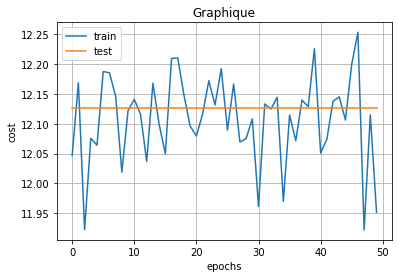

--Entrainement de net2 --


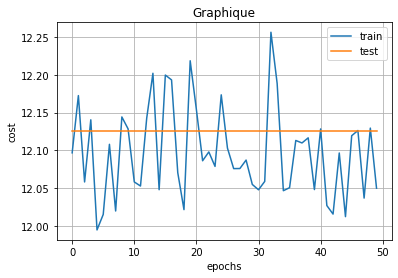

-- Fin de l'entrainement--
RMSE de net1 sur les donnees test: 3.4822559356689453
MAE de net1 sur les donnees test: 3.3058078289031982
RMSE de net2 sur les donnees test: 3.4822559356689453
MAE de net2 sur les donnees test: 3.3058078289031982
Taux d'apprentissage =  0.001
--Entrainement de net1 --


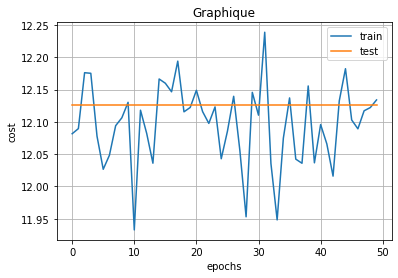

--Entrainement de net2 --


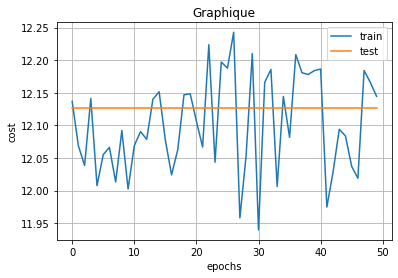

-- Fin de l'entrainement--
RMSE de net1 sur les donnees test: 3.4822559356689453
MAE de net1 sur les donnees test: 3.3058078289031982
RMSE de net2 sur les donnees test: 3.4822559356689453
MAE de net2 sur les donnees test: 3.3058078289031982
Taux d'apprentissage =  0.0001
--Entrainement de net1 --


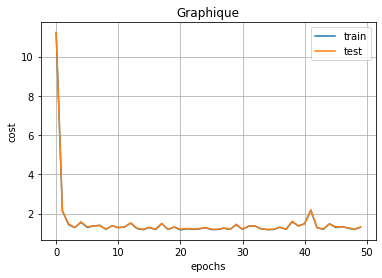

--Entrainement de net2 --


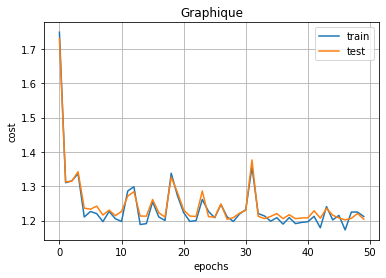

-- Fin de l'entrainement--
RMSE de net1 sur les donnees test: 1.1455483436584473
MAE de net1 sur les donnees test: 0.9329322576522827
RMSE de net2 sur les donnees test: 1.0949442386627197
MAE de net2 sur les donnees test: 0.8976832032203674


In [230]:
#lr = taux d'apprentissage, hyperparamètre crucial dans l'entrainement des réseaux
#Le taux d'apprentissage contrôle la taille des pas que notre algorithme d'optimisation prend lors de la mise à jour des poids du modèle
#Un taux d'apprentissage trop élevé peut entraîner une divergence du modèle
#Un taux d'apprentissage trop faible peut entraîner une convergence lente

#n_epochs = nombre d'époques 
#Le nombre d'époques spécifie combien de fois l'ensemble d'entraînement complet est utilisé pour entraîner le modèle.
#Trop peu d'époques peuvent entraîner un sous-apprentissage, tandis que trop d'époques peuvent entraîner un sur-apprentissage.


# Création d'un dictionnaire pour stocker les réseaux de neurones avec les valeurs de taux d'apprentissage correspondantes
networks = {}

for alpha in [0.01,0.001,0.0001]:
    
    # regression linéaire
    net1 = nn.Sequential(
        nn.Linear(in_features=769, out_features=1),
        nn.ReLU(),
    )

    # réseau à trois couches avec ReLU pour chaque couche
    net2 = nn.Sequential(
        nn.Linear(in_features=769, out_features=20),
        nn.ReLU(),
        nn.Linear(in_features=20, out_features=10),
        nn.ReLU(),
        nn.Linear(in_features=10, out_features=1), 
        nn.ReLU(),
    )
    
    print("Taux d'apprentissage = ",alpha)
    
    print('--Entrainement de net1 --')

    optimizer1 = Adam(net1.parameters(),lr=alpha)
    pytorch_fit(net1, X_train, Y_train, X_test, Y_test, fonction_de_cout_regression, optimizer1, n_epochs=50)

    print('--Entrainement de net2 --')

    optimizer2 = Adam(net2.parameters(),lr=alpha)
    pytorch_fit(net2, X_train, Y_train, X_test, Y_test, fonction_de_cout_regression, optimizer2, n_epochs=50)

    print("-- Fin de l'entrainement--")

    print('RMSE de net1 sur les donnees test:', RMSE(net1,X_test,Y_test))
    print('MAE de net1 sur les donnees test:', MAE(net1,X_test,Y_test))
    
    print('RMSE de net2 sur les donnees test:', RMSE(net2,X_test,Y_test))
    print('MAE de net2 sur les donnees test:', MAE(net2,X_test,Y_test))
    
    networks[alpha] = (net1, net2)

#Pour l'instant, le réseau donnant les meilleurs performances est le réseau net2 avec lr=0.0001 et n_epochs=50

Taux d'apprentissage =  0.0001
--Entrainement de net3 --


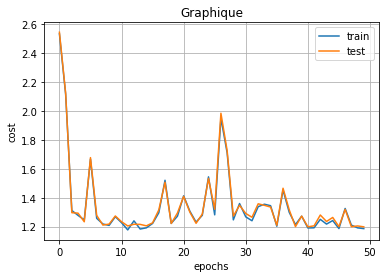

--Entrainement de net4 --


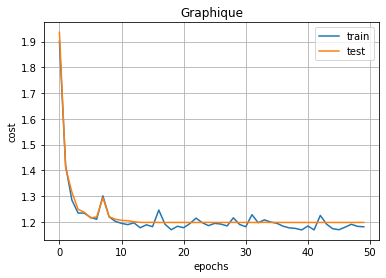

-- Fin de l'entrainement--
RMSE de net3 sur les donnees test: 1.0902470350265503
MAE de net3 sur les donnees test: 0.9004672169685364
RMSE de net4 sur les donnees test: 1.094497799873352
MAE de net4 sur les donnees test: 0.9034404158592224


In [231]:
#On essaye d'ajouter du dropout pour voir si on obtient de meilleures performances.
#Le dropout est une technique de régularisation qui consiste à désactiver aléatoirement un certain pourcentage des neurones 
#lors de chaque itération de l'entraînement, ce qui aide à prévenir le surapprentissage.

net3 = nn.Sequential(
    nn.Linear(in_features=769, out_features=1),
    nn.ReLU(),
    nn.Dropout(p=0.2)  
)

net4 = nn.Sequential(
    nn.Linear(in_features=769, out_features=20),
    nn.ReLU(),
    nn.Dropout(p=0.2),  
    nn.Linear(in_features=20, out_features=10),
    nn.ReLU(),
    nn.Dropout(p=0.2), 
    nn.Linear(in_features=10, out_features=1), 
    nn.ReLU(),
)

alpha = 0.0001 #le taux ayant donné les meilleures performances précédemment 

print("Taux d'apprentissage = ",alpha)

print('--Entrainement de net3 --')

optimizer3 = Adam(net3.parameters(),lr=alpha)
pytorch_fit(net3, X_train, Y_train, X_test, Y_test, fonction_de_cout_regression, optimizer3, n_epochs=50)

print('--Entrainement de net4 --')

optimizer4 = Adam(net4.parameters(),lr=alpha)
pytorch_fit(net4, X_train, Y_train, X_test, Y_test, fonction_de_cout_regression, optimizer4, n_epochs=50)

print("-- Fin de l'entrainement--")

print('RMSE de net3 sur les donnees test:', RMSE(net3,X_test,Y_test))
print('MAE de net3 sur les donnees test:', MAE(net3,X_test,Y_test))

print('RMSE de net4 sur les donnees test:', RMSE(net4,X_test,Y_test))
print('MAE de net4 sur les donnees test:', MAE(net4,X_test,Y_test))

#Le fait d'ajouter du dropout sur les réseaux n'a pas l'air d'avoir un impact significatif sur les performances. 

In [ ]:
#Au vu des résulats obtenus, on a donc décidé d'utiliser le réseau net2 avec lr=0.0001 et n_epochs=50. 

## Les 10 meilleurs recommandations

In [236]:
#On veut déterminer les 10 meilleures recommandations pour l'user_id = '1380819'.
#On a X_user qui va servir d'entrée au réseau de neurones 

reseau = networks[0.0001][1]

#On va prédire les notes pour tout les films que l'utilisateur n'a pas vu.
#On va stocker dans la liste recommandation_possible des tuples de la forme (titre du film, note)

recommandation_possible = [] 

reseau.eval()

for i in range(X_user.size(0)):
    input_data = X_user[i, :].unsqueeze(0)  # Nous devons ajouter une dimension pour obtenir la forme (1, features)
    prediction = net2(input_data)
    recommandation_possible.append( (df_user.iloc[i][3],prediction.item()) )

recommandation_possible.sort(key=lambda x: x[1], reverse=True)
    
if (len(recommandation_possible) < 10) : #L'utilisateur n'a pas noté moins de 10 films, il lui reste donc moins de 10 films à regarder alors on lui recommande tout les films qu'il n'a pas vu

    films_recommander = [titre for titre,note in recommandation_possible]
    print("L'utilisateur n'a pas noté moins de 10 films")
    print("Ainsi les meilleurs recommendation sont les films qu'il n'a pas vu")
    print(films_recommander)

else:
    films_recommander = [titre for titre,note in recommandation_possible[:10]]
    print("Les 10 meilleures recommandations sont : ",films_recommander)  

Les 10 meilleures recommandations sont :  ['21 Grams', 'Alfie', 'After the Sunset', 'Divine Secrets of the Ya-Ya Sisterhood', 'Bridget Jones: The Edge of Reason', 'A Beautiful Mind', 'Harry Potter and the Chamber of Secrets', 'Batman Begins', 'Harry Potter and the Prisoner of Azkaban', 'Adaptation.']


# Conclusion

In [ ]:
#Si nous devions choisir un seul modèle pour déterminer les 10 meilleurs recommandations il serait judicieux d'utiliser 
#la méthode avec la SVD car c'est cette méthode qui a la meilleure performance que ce soit pour RMSE ou MAE. 